In [17]:
!pip install deeptrack

In [18]:
import deeptrack as dt
from PIL import Image
import glob
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os.path
import tensorflow as tf

In [19]:
!git clone https://github.com/Santhosh-Shivan/SummerProject-ParticleTrack.git

Cloning into 'SummerProject-ParticleTrack'...
remote: Enumerating objects: 165, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (161/161), done.
remote: Total 165 (delta 4), reused 165 (delta 4), pack-reused 0
Receiving objects: 100% (165/165), 6.36 MiB | 14.24 MiB/s, done.
Resolving deltas: 100% (4/4), done.


In [20]:
%cd /content/SummerProject-ParticleTrack

/content/SummerProject-ParticleTrack


In [21]:
# Defining the Network for Particle Position Prediction
import keras.backend as K
import keras.optimizers as optimizers
def pixel_error(T, P):
    return K.mean(K.sqrt(K.sum(K.square(T - P), axis=-1))) * IMAGE_SIZE
IMAGE_SIZE = 128
pos_model = dt.models.Convolutional(
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 1),
    conv_layers_dimensions=(16, 32, 64, 64),
    dense_layers_dimensions=(32, 32),
    steps_per_pooling=1,
    number_of_outputs=2,
    loss="mse",
    metrics=[pixel_error],
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    convolution_block=dt.layers.ConvolutionalBlock(kernel_size=5),
    dense_block=dt.layers.DenseBlock(activation="relu"),
    pooling_block=dt.layers.PoolingBlock(padding="valid")
)

pos_model.load_weights("./3dOrientation_Network11")

In [22]:
# Defining the Network for Particle Angle Prediction

ang_model = dt.models.Convolutional(
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 1),
    conv_layers_dimensions=(16, 32, 64, 64),
    dense_layers_dimensions=(32, 32),
    steps_per_pooling=1,
    number_of_outputs=4,
    loss="mse",
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    convolution_block=dt.layers.ConvolutionalBlock(kernel_size=5),
    dense_block=dt.layers.DenseBlock(activation="relu"),
    pooling_block=dt.layers.PoolingBlock(padding="valid")
)

ang_model.load_weights("./3dOrientation_NetworkAngle1")

## Change Test images Directory as required

In [23]:
image_list = [Image.open(filename) for filename in glob.glob('./new test images_video1/*.jpg') ]

In [24]:
#Pre-processing the test images


gray_images = [cv2.cvtColor(np.asarray(image_list[i]), cv2.COLOR_BGR2GRAY) for i in range(len(image_list))]
y = np.expand_dims(gray_images, axis=0)
img = y.reshape((len(image_list), IMAGE_SIZE, IMAGE_SIZE, 1))

#Normalization(0-1)
def min_max_normalization(z,min,max):
    z = (z-np.min(z))/(np.max(z)-np.min(z))*(max-min)+min
    return z

img = min_max_normalization(img, 0, 1)

In [25]:
#Particle Position Prediction
pos_prediction = pos_model.predict(img)

In [26]:
#Particle Angle Prediction
angles_prediction = ang_model.predict(img)

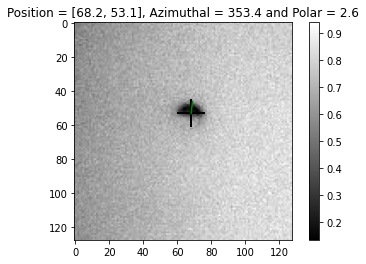

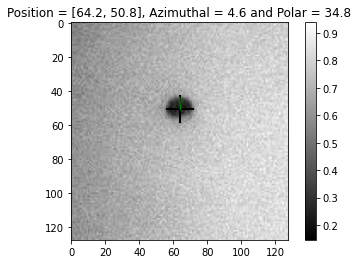

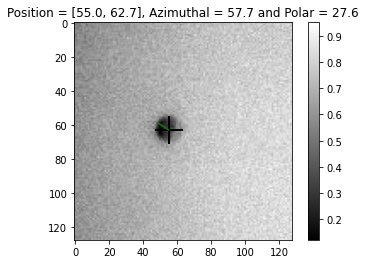

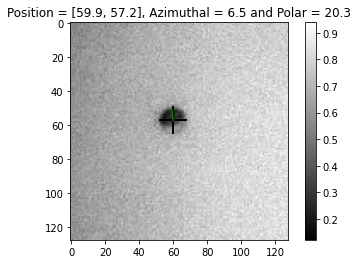

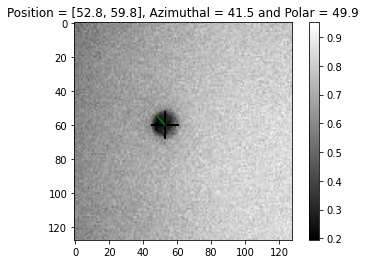

...

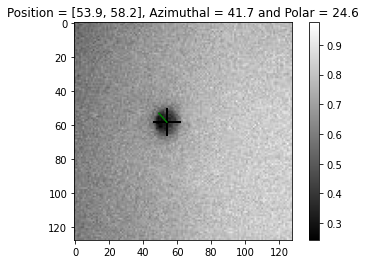

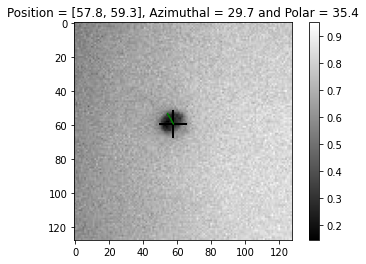

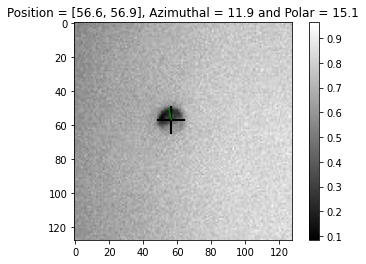

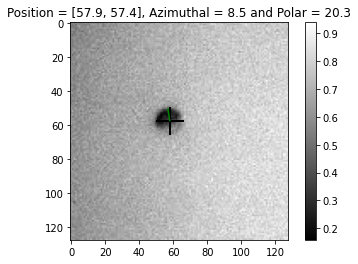

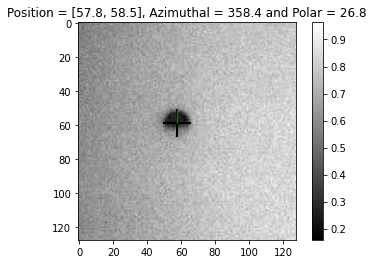

In [34]:
#Showing the prediction
radius = 7
for i in range(len(img)):
    position_of_particle = np.array([pos_prediction[i,0], pos_prediction[i,1]])
    position_of_particle = position_of_particle * IMAGE_SIZE 

    #Calculating Azimuthal Angle in degrees(0-360)
    if angles_prediction[i,1] == 0 and angles_prediction[i,0] == 1:
        azimuthal_ang = np.pi/2*180/np.pi
    elif angles_prediction[i,1] == 0 and angles_prediction[i,0] == -1:
        azimuthal_ang = 3*np.pi/2*180/np.pi
    else:

        if angles_prediction[i,0]>0 and angles_prediction[i,1]>0:
            azimuthal_ang = np.arctan(angles_prediction[i,0]/angles_prediction[i,1])*180/np.pi
        elif angles_prediction[i,0]>0 and angles_prediction[i,1]<0:
            azimuthal_ang = (np.arctan(angles_prediction[i,0]/angles_prediction[i,1])+np.pi)*180/np.pi
        elif angles_prediction[i,0]<0 and angles_prediction[i,1]<0:
            azimuthal_ang = (np.arctan(angles_prediction[i,0]/angles_prediction[i,1])+np.pi)*180/np.pi
        elif angles_prediction[i,0]<0 and angles_prediction[i,1]>0:
            azimuthal_ang = (np.arctan(angles_prediction[i,0]/angles_prediction[i,1])+2*np.pi)*180/np.pi

    #Calculating Polar angle in degrees(0-90)
    if angles_prediction[i,3] == 0 and angles_prediction[i,2] == 1:
        polar_ang = np.pi/2*180/np.pi
    
    else:
        polar_ang = np.arctan(angles_prediction[i,2]/angles_prediction[i,3])*180/np.pi
    
    plt.imshow(img[i].reshape((IMAGE_SIZE, IMAGE_SIZE)), cmap="gray")
    plt.colorbar()
    plt.title(f"Position = [%.1f, %.1f], Azimuthal = %.1f and Polar = %.1f" %(position_of_particle[0], position_of_particle[1],azimuthal_ang, polar_ang))
    plt.scatter(position_of_particle[0], position_of_particle[1], s = 800, marker='+', linewidth=2, color = "black")

    #Line joining centre of the particle and top of the dark region
    x_values = [position_of_particle[0], position_of_particle[0] + radius*np.cos(azimuthal_ang*np.pi/180 + np.pi/2)]
    y_values = [position_of_particle[1], position_of_particle[1] - radius*np.sin(azimuthal_ang*np.pi/180 + np.pi/2)]

    plt.plot(x_values, y_values, color='g')
    plt.show()

## Prediction on video

In [ ]:
import cv2
import os

vidcap = cv2.VideoCapture('./5mw_90.avi')
success,frame = vidcap.read()

while success:
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)  
    plt.imshow(frame)
    plt.show()  
    clear_output